### tsdGAN: A generative adversarial network approach for removing electrocardiographic interference from electromyographic signals 
Lucas Haberkamp<sup>1,2</sup> Charles A. Weisenbach<sup>1</sup> Peter Le<sup>3</sup>  
<sup>1</sup>Naval Medical Research Unit Dayton, Wright-Patterson Air Force Base, OH, USA   
<sup>2</sup>Leidos, Reston, VA, USA   
<sup>3</sup>Air Force Research Laboratory, 711th Human Performance Wing, Wright-Patterson Air Force Base, OH, USA

#### This notebook is used to pre-process experimental data for tsdGAN training.

In [22]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from sklearn.preprocessing import StandardScaler
import plotly.graph_objects as go

Define Butterworth filter function

In [23]:
def butterfilter(x, Fc, Fs, type='low'):
    Wn = np.asarray(Fc)/np.asarray(Fs/2)
    b, a = signal.butter(2, Wn, type)
    return signal.filtfilt(b,a,x)

Define helper function to load in EMG dataset

In [24]:
# fill_nan should be used with classification ground truth data. prevents a nan label.
def extractdf(data_path):
    file_list, df_list = [], [] # initialize lists
    for filename in sorted(os.listdir(data_path)):
        f = os.path.join(data_path, filename) 
        if os.path.splitext(filename)[1] == '.csv':
            current_file = os.path.splitext(filename)[0] # get the identifier of the participant from the file
            file_list.append(current_file)  
            tmp_df = pd.read_csv(f, header=13)
            df_list.append(tmp_df)

    return df_list, file_list

In [25]:
# Specify paths
path = '../../Data/Raw TS EMG Data/Training/'

# Extract the data as dataframes stored into lists
data_list, file_list = extractdf(path)

print("Files in the dataset:", file_list)

# Set scaler object
scaler = StandardScaler()

Files in the dataset: ['TrunkStability_DS_S20_EMG_Raw_06', 'TrunkStability_DS_S20_EMG_Raw_09', 'TrunkStability_DS_S20_EMG_Raw_58']


Movement List:   
TrunkStability_DS_S20_EMG_Raw_06 - Axial Twist    
TrunkStability_DS_S20_EMG_Raw_09 - Multiplanar 20lb Lift  
TrunkStability_DS_S20_EMG_Raw_58 - Cyclic Flexion-Extension

In [26]:
# Set hyperparameters
muscle_list = data_list[0].columns[3:]
Fs = 1920
window_size = 960

In [27]:
def getlabels(raw_inputs, plotting=False):
  
  inputs = np.hstack([np.zeros(shape=(10,)), raw_inputs.squeeze(), np.zeros(shape=(10,))])

  filtered = butterfilter(inputs, Fc=[5, 12], Fs=Fs, type='bandpass')
  differentiate = pd.Series(np.gradient(filtered)*Fs)
  squared = differentiate**2
  integrated = squared.rolling(window=int(0.15*Fs), center=True, min_periods=1).mean()
  threshold = squared.rolling(window=int(1.5*Fs), center=True, min_periods=1).mean()

  if plotting:
    fontsize = 12
    lw = 2

    t = np.arange(len(inputs)) / Fs
    fig, axs = plt.subplots(5, 1, sharex=True, figsize=(14, 12), facecolor='white')

    axs[0].plot(t, inputs, label='Contaminated EMG', color='k', linewidth=lw-0.5)
    axs[0].set_ylabel('Amplitude (mV)', fontsize=fontsize)
    axs[0].legend(fontsize=fontsize)
    axs[0].grid(True, linestyle='--', alpha=0.5) 

    axs[1].plot(t, filtered, label='5-12 Hz Bandpass Filtered', linewidth=lw)
    axs[1].set_ylabel('Amplitude (mV)', fontsize=fontsize)
    axs[1].legend(fontsize=fontsize)
    axs[1].grid(True, linestyle='--', alpha=0.5) 

    axs[2].plot(t, differentiate, label='Differentiated', color='crimson', linewidth=lw)
    axs[2].set_ylabel('\u0394Amplitude (mV/s)', fontsize=fontsize)
    axs[2].legend(fontsize=fontsize)
    axs[2].grid(True, linestyle='--', alpha=0.5) 

    axs[3].plot(t, squared, label='Squared', color='teal', linewidth=lw)
    axs[3].set_ylabel('\u0394Amplitude (mV\u00B2/s)', fontsize=fontsize)
    axs[3].legend(fontsize=fontsize)
    axs[3].grid(True, linestyle='--', alpha=0.5) 

    axs[4].plot(t, integrated, label='0.15s Moving Average', color='mediumpurple', linewidth=lw)
    axs[4].plot(t, threshold, label='1.50s Moving Average', color='red', linewidth=lw)
    axs[4].set_ylabel('\u0394Amplitude (mV\u00B2/s)', fontsize=fontsize)
    axs[4].legend(fontsize=fontsize)
    axs[4].grid(True, linestyle='--', alpha=0.5) 
    
    axs[4].set_xlabel('Time (s)', fontsize=fontsize)

    for i in range(5):
      axs[i].set_xlim(t[0], t[-1])

    plt.show()

  curr_label = np.ones(shape=(inputs.shape[0], 1))
  curr_label[integrated > threshold] = 0
  return curr_label[10:-10]

Function to obtain a separate batches of sequences with and without ECG contamination

In [28]:
def get_sequences(arr_size, data, ecg_label, window_size=window_size):
    
    x_count = 0
    x = []
    label = []
    while x_count < arr_size:
        i = np.random.randint(window_size, data.shape[0])
        if np.sum(ecg_label[i-window_size+200:i-200]==0) > 120:
            curr_data = data[i-window_size:i]
            x.append(curr_data)
            label.append(ecg_label[i-window_size:i])
            x_count += 1

    y_count = 0
    y = []
    while y_count < arr_size:
        i = np.random.randint(window_size, data.shape[0])
        if np.all(ecg_label[i-window_size:i]==1):
            curr_data = data[i-window_size:i]
            y.append(curr_data)
            y_count += 1

    x = np.array(x)
    y = np.array(y)
    label = np.array(label)
    label = np.repeat(label, 10, axis=2)

    return x, y, label

Helper function to create dynamic plots

In [29]:
def makeplot(data, title, xaxis_title, yaxis_title, legend):

  fig = go.Figure()

  for i in range(len(legend)):
    name = legend[i]
      
    fig.add_trace(go.Scatter(
        x = None,
        y = data[i],
        mode='lines',
        name=name
    ))

    fig.update_layout(
        xaxis_title = xaxis_title,
        yaxis_title = yaxis_title,
        title_text= title
    )

  fig.show()

Function to obtain the dataset used for training ECGbe-GAN

In [30]:
def get_dataset(df):
        
    ecg_label = getlabels(df['AbsL'], plotting=True).squeeze()

    z1 = df['AbsL'].copy()
    z2 = df['AbsL'].copy()
    z1.loc[ecg_label == 0] = np.nan
    z2.loc[ecg_label == 1] = np.nan

    makeplot([z1, z2], title='R Peak Locations', xaxis_title='Samples', yaxis_title='Amplitude (mV)', legend=['Clean', 'QRS'])

    ecg_label = np.expand_dims(ecg_label, axis=1)

    data = scaler.fit_transform(df.values)
    x, y, label = get_sequences(arr_size=500, data=data, ecg_label=ecg_label)

    print(x.shape, y.shape, label.shape)

    return x, y, label

Obtain the training data


 TrunkStability_DS_S20_EMG_Raw_06


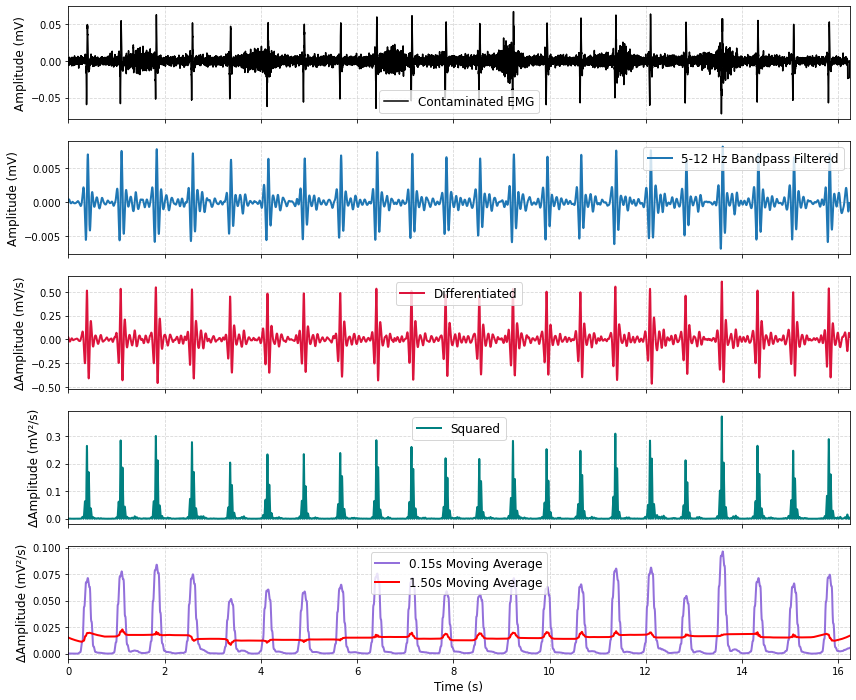

(500, 960, 10) (500, 960, 10) (500, 960, 10)

 TrunkStability_DS_S20_EMG_Raw_09


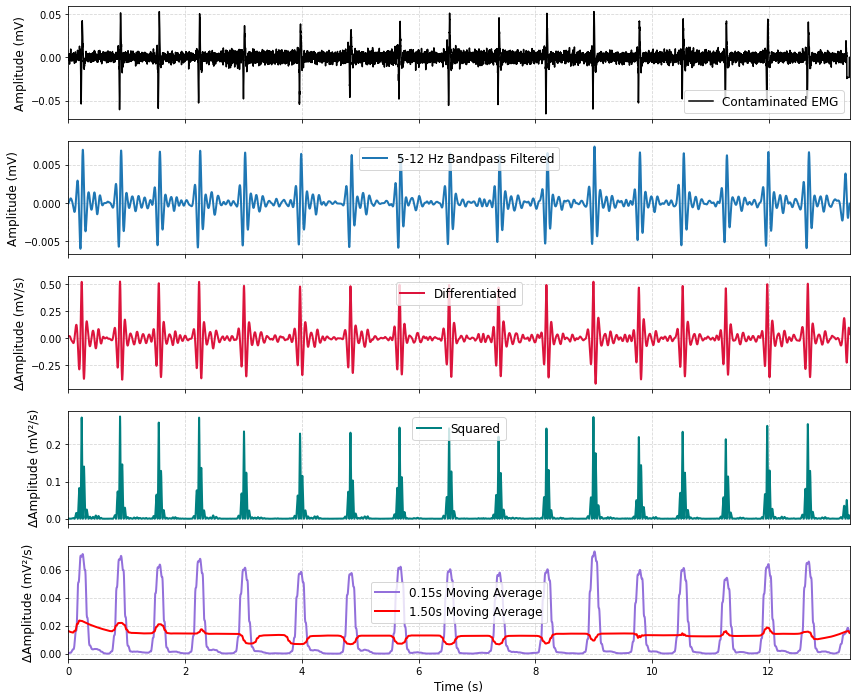

(500, 960, 10) (500, 960, 10) (500, 960, 10)

 TrunkStability_DS_S20_EMG_Raw_58


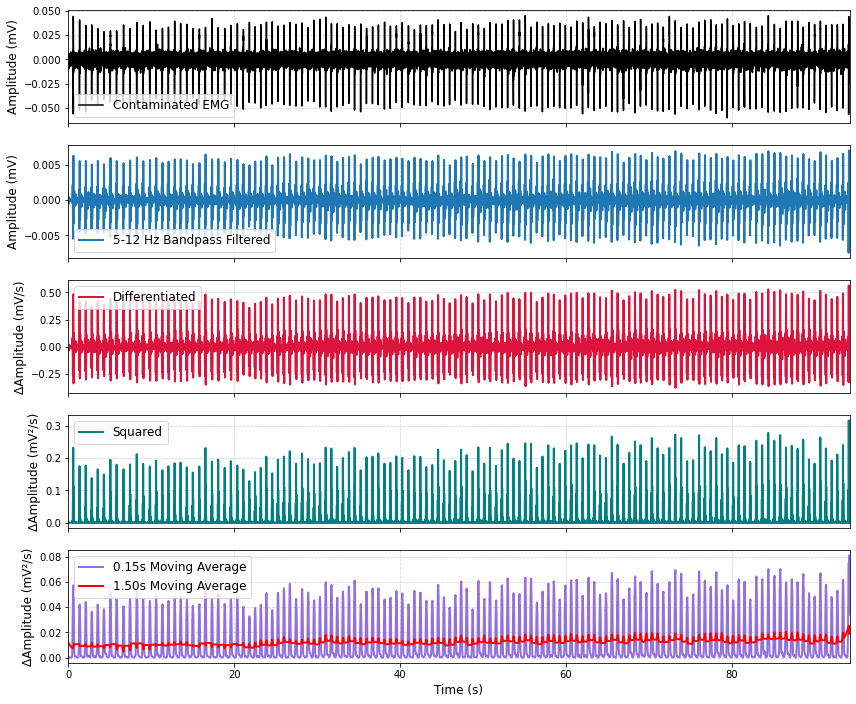

(500, 960, 10) (500, 960, 10) (500, 960, 10)


In [31]:
x_real, y_real, label_real = [], [], []
for i, df in enumerate(data_list):
    print('\n', file_list[i])
    df1 = df[muscle_list]
    df1 = df1 - df1.mean()
    df1 = df1.apply(lambda x: butterfilter(x, Fc=500, Fs=1920, type='low'))
    tmp_x, tmp_y, tmp_label = get_dataset(df1)
    x_real.append(tmp_x)
    y_real.append(tmp_y)
    label_real.append(tmp_label)

x_real = np.concatenate(x_real, axis=0)
y_real = np.concatenate(y_real, axis=0)
label_real = np.concatenate(label_real, axis=0)


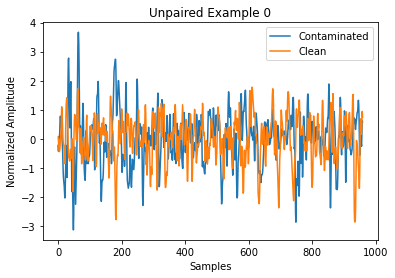

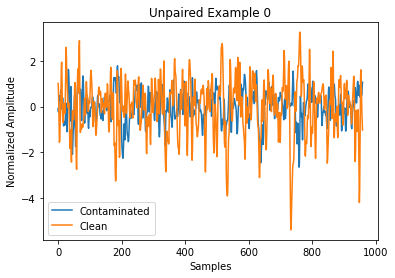

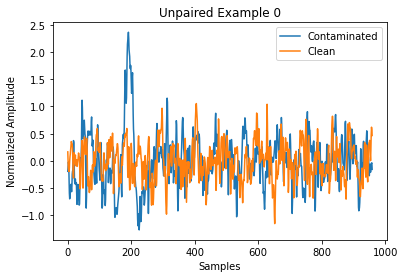

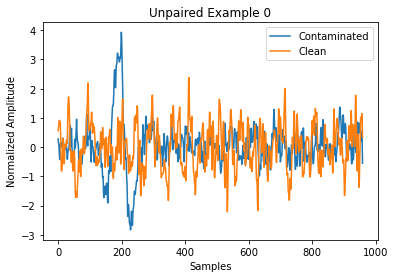

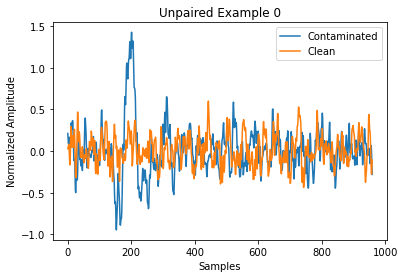

...

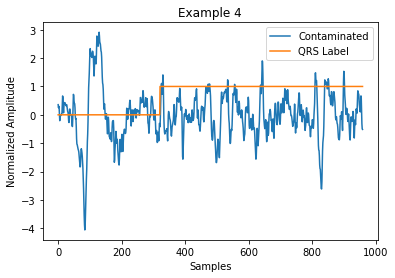

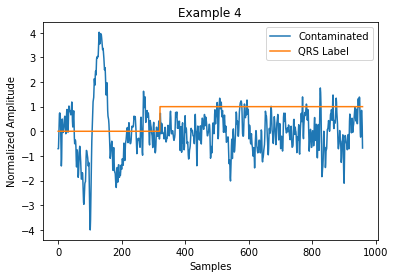

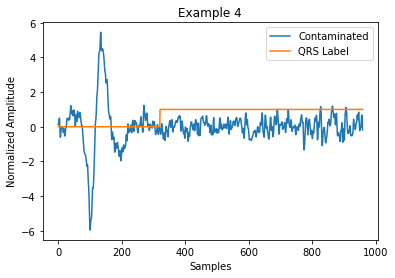

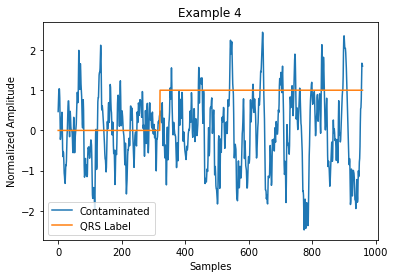

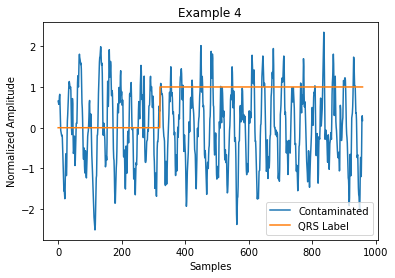

In [32]:
for i in range(5):
    for j in range(x_real.shape[2]):
        plt.plot(x_real[i,:,j])
        plt.plot(y_real[i,:,j])
        plt.title('Unpaired Example ' + str(i))
        plt.ylabel('Normalized Amplitude')
        plt.xlabel('Samples')
        plt.legend(['Contaminated', 'Clean'])
        plt.show()

for i in range(5):
    for j in range(x_real.shape[2]):
        plt.plot(x_real[i,:,j])
        plt.plot(label_real[i,:,j])
        plt.title('Example ' + str(i))
        plt.ylabel('Normalized Amplitude')
        plt.xlabel('Samples')
        plt.legend(['Contaminated', 'QRS Label'])
        plt.show()

In [33]:
print("Training Shape =", x_real.shape)

Training Shape = (1500, 960, 10)


In [36]:
# np.save('../../Data/Preprocessed Data/Experimental/x_real.npy', x_real)
# np.save('../../Data/Preprocessed Data/Experimental/y_real.npy', y_real)
# np.save('../../Data/Preprocessed Data/Experimental/label_real.npy', label_real)